# Datos tabulares

## Librerías

In [13]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
import seaborn as sns
from typing import List
from ydata_profiling import ProfileReport
import umap

pd.set_option('display.max_columns', 1000)

np.random.seed(42)
pio.renderers.default = "plotly_mimetype+notebook"

DATA_PATH = "../data/tabular-data/"
REPORTING_PATH = "../data/reporting/"
PROJECTIONS_PATH = "../data/projections/"

## Dataset

In [2]:
kdd99 = pd.read_csv(f"{DATA_PATH}kdd-cup-1999-data-pycon.csv", delimiter=',')

In [3]:
kdd99.shape

(154277, 42)

In [4]:
kdd99.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,root_shell,su_attempted,num_root,num_file_creations,num_shells,num_access_files,num_outbound_cmds,is_host_login,is_guest_login,count,srv_count,serror_rate,srv_serror_rate,rerror_rate,srv_rerror_rate,same_srv_rate,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,label
0,0,icmp,ecr_i,SF,1032,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,511,511,0.0,0.0,0.0,0.0,1.00,0.00,0.0,255,255,1.00,0.00,1.0,0.0,0.0,0.0,0.0,0.0,smurf.
1,0,icmp,ecr_i,SF,1032,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,510,510,0.0,0.0,0.0,0.0,1.00,0.00,0.0,255,255,1.00,0.00,1.0,0.0,0.0,0.0,0.0,0.0,smurf.
2,0,tcp,private,S0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,136,16,1.0,1.0,0.0,0.0,0.12,0.05,0.0,255,4,0.02,0.08,0.0,0.0,1.0,1.0,0.0,0.0,neptune.
3,0,tcp,private,REJ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,137,4,0.0,0.0,1.0,1.0,0.03,0.06,0.0,255,4,0.02,0.05,0.0,0.0,0.0,0.0,1.0,1.0,neptune.
4,0,icmp,ecr_i,SF,1032,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,511,511,0.0,0.0,0.0,0.0,1.00,0.00,0.0,255,255,1.00,0.00,1.0,0.0,0.0,0.0,0.0,0.0,smurf.


### Descripción de los tipos de tráfico (indicados por la variable 'label'):

| **Tipo de Ataque**     | **Descripción**                                                                                                                                                     |
|:-----------------------|:--------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| **Smurf**              | Un ataque DDoS que utiliza solicitudes de eco ICMP enviadas a una dirección de difusión, abrumando a la víctima con respuestas.                                   |
| **Neptune**            | Un ataque de inundación SYN que agota los recursos del servidor enviando numerosas solicitudes SYN para establecer conexiones TCP.                                  |
| **Normal**             | Tráfico regular sin ningún comportamiento malicioso, que sirve como base para comparaciones.                                                                      |
| **Back**               | Un ataque que utiliza un caballo de Troya para abrir una puerta trasera, permitiendo el acceso no autorizado a los sistemas.                                       |
| **Satan**              | Un ataque de escaneo de red para encontrar vulnerabilidades utilizando la herramienta Satan.                                                                         |
| **Ipsweep**            | Un ataque de reconocimiento que escanea un rango de direcciones IP para identificar hosts activos.                                                                  |
| **Portsweep**          | Similar a Ipsweep, implica escanear múltiples puertos en hosts para encontrar servicios abiertos.                                                                    |
| **Warezclient**        | Un ataque relacionado con la compartición ilegal de archivos y la descarga de software pirateado.                                                                   |
| **Teardrop**           | Un ataque que envía paquetes fragmentados a un objetivo, causando que se bloquee o se vuelva inestable.                                                            |
| **Pod**                | Un ataque de Ping of Death que envía paquetes sobredimensionados, lo que lleva a bloqueos del sistema o inestabilidad.                                            |
| **Nmap**               | Una herramienta de escaneo de red utilizada para descubrir hosts y servicios, que también puede ser explotada con fines maliciosos.                                |
| **Guess_passwd**       | Un ataque que intenta adivinar contraseñas de usuario a través de varios métodos, como ataques de fuerza bruta o diccionario.                                    |
| **Buffer_overflow**    | Un ataque que explota el búfer de un programa escribiendo más datos de los que puede contener, lo que permite la ejecución de código arbitrario.                  |
| **Land**               | Un ataque que envía paquetes con la misma dirección IP de origen y destino, causando confusión y potencial denegación de servicio.                                 |
| **Warezmaster**        | Similar a Warezclient, enfocado en distribuir software pirateado, a menudo involucrando redes de pares.                                                            |


## Profile report

El **perfilado de datos** es el proceso de examinar, analizar y resumir de manera exhaustiva un conjunto de datos. Esto implica generar de estadísticas descriptivas y métricas clave sobre las características de los datos, como el tipo de datos, las distribuciones, los valores faltantes, las relaciones entre variables, y cualquier anomalía sencilla o patrón notable.

### ¿Por qué es importante el perfilado de datos?
1. **Comprensión inicial de los datos**: Es el primer paso esencial en la exploración de datos, permitiendo a los analistas o científicos de datos obtener una visión clara de la estructura y calidad del conjunto de datos.
   
2. **Detección de problemas de calidad**: Ayuda a identificar problemas como valores ausentes, duplicados, outliers y errores en el formato de los datos. Esto es crucial para tomar decisiones informadas sobre la limpieza y transformación necesarias antes de proceder con el modelado o análisis.

3. **Estandarización del proceso de exploración**: Al realizar un perfilado, se crea un proceso sistemático y repetible para explorar cualquier conjunto de datos. Esto facilita la **transparencia** y **reproducibilidad**, ya que otros miembros del equipo pueden revisar y comprender rápidamente el análisis exploratorio realizado.

4. **Comunicación clara**: Al generar un informe detallado y automatizado sobre los datos, se facilita la **comunicación entre equipos**, ya que tanto analistas como stakeholders pueden revisar el perfil de los datos sin necesidad de un conocimiento técnico profundo.

   

### ydata-profiling
**Ydata-profiling** (anteriormente conocido como pandas-profiling) es una herramienta que **automatiza el perfilado de datos** y proporciona un informe completo con información relevante sobre el conjunto de datos. Ofrece varias características importantes:

1. **Resumen automático de las variables**: Genera un análisis detallado de cada variable del dataset (numéricas, categóricas, fechas, etc.), incluyendo su distribución, valores únicos, porcentajes de valores faltantes y su impacto en el análisis posterior.
   
2. **Detección de correlaciones**: Identifica correlaciones entre variables para ayudar a detectar redundancias o relaciones fuertes que podrían ser relevantes para modelos predictivos o análisis avanzados.
   
3. **Análisis de interacciones**: Permite explorar cómo interactúan dos o más variables entre sí, lo que es útil para análisis multivariados.
   
4. **Detección de anomalías**: Identifica automáticamente posibles outliers, duplicados y otros problemas de calidad en los datos.
   
5. **Generación de reportes interactivos en HTML**: Ydata-profiling genera **reportes en formato HTML**, lo que permite visualizar el análisis de forma interactiva. Estos informes son fáciles de compartir y revisar por cualquier miembro del equipo, incluso aquellos sin conocimientos técnicos avanzados.

6. **Versionable**: Como los reportes generados son archivos, pueden ser **versionados** usando sistemas de control de versiones como Git, permitiendo un seguimiento y comparación de cómo han evolucionado los datos y el análisis exploratorio en distintas etapas de un proyecto.

### Importancia en la estandarización y el proceso colaborativo
Ydata-profiling facilita la creación de un proceso de exploración de datos estandarizado. Al ser una herramienta automatizada, ahorra tiempo en la creación de resúmenes de datos y asegura que todos los aspectos relevantes de los datos sean analizados de forma consistente. Esto fomenta la **colaboración** y asegura que todos los equipos trabajen con el mismo conocimiento detallado de los datos, mejorando la eficiencia en proyectos conjuntos.


AÑADIR COMPARATIVA CON NOTEBOOKS DE KAGGLE Y LO TEDIOSAS QUE SON.

MENCIONAR SU UTILIDAD COMO PRIMER PASO EN EXPLORACIÓN DE DATOS PEQUEÑOS / MEDIANOS O PARA TENER UNA PRIMERA INTUICIÓN DE LOS DATOS.

In [ ]:
# Código para generar un profile report completo.
profile = ProfileReport(kdd99, title="Base Profiling Report")
profile.to_file(f"{REPORTING_PATH}profile_report.html")

In [ ]:
def generate_efficient_profile(df: pd.DataFrame, sampling_fraction: float = 1.0) -> ProfileReport:
    """
    Genera un ProfileReport eficiente para dataframes grandes utilizando ydata-profiling.
    
    Args:
        df (pd.DataFrame): El dataframe a perfilar.
        sampling_fraction (float): La fracción de filas a muestrear (por defecto es 1.0 para no muestrear).

    Returns:
        ProfileReport: El ProfileReport generado.
    """
    # Calcula el tamaño de la muestra en función de la fracción de muestreo
    sample_size = int(len(df) * sampling_fraction)

    # Muestra el dataframe si la fracción de muestreo es menor que 1.0
    if sampling_fraction < 1.0 and len(df) > sample_size:
        df_sampled = df.sample(n=sample_size, random_state=42)
    else:
        df_sampled = df

    # Genera el informe de perfil con configuraciones eficientes
    profile = ProfileReport(
        df_sampled,
        title="Informe de Perfil de Datos Eficiente",
        minimal=True,  # Usa el modo mínimo para omitir cálculos pesados como interacciones
    )
    return profile

In [ ]:
# Generamos una versión reducida del ProfileReport
profile = generate_efficient_profile(kdd99)
profile.to_file(f"{REPORTING_PATH}reduced_profile_report.html")

## Limpieza de los datos acorde al análisis preliminar realizado

In [5]:
def remove_constant_columns(df: pd.DataFrame) -> pd.DataFrame:
    """
    Remove columns from the DataFrame that have constant values.
    
    Args:
        df (pd.DataFrame): The DataFrame to process.
        
    Returns:
        pd.DataFrame: The DataFrame with constant columns removed.
    """
    # Use nunique to find unique value counts for each column and keep only those with more than 1 unique value
    constant_mask = df.nunique() > 1
    
    # Filter the DataFrame to keep only non-constant columns
    df_cleaned = df.loc[:, constant_mask]

    return df_cleaned
    
def encode_kdd99(df: pd.DataFrame, columns_to_encode: List) -> pd.DataFrame:
    """
    Encodes the categorical variables in the KDD99 dataset using one-hot encoding.

    Args:
        df (pd.DataFrame): The original KDD99 DataFrame with categorical variables.

    Returns:
        pd.DataFrame: The DataFrame with categorical variables one-hot encoded.
    """
    # Perform one-hot encoding
    df_encoded = pd.get_dummies(df, columns=columns_to_encode, drop_first=True)

    return df_encoded

def drop_highly_correlated_features(df: pd.DataFrame, threshold: float = 0.98) -> pd.DataFrame:
    """
    Drops columns from the DataFrame that have a correlation higher than the specified threshold.
    
    Args:
        df (pd.DataFrame): The input dataframe with numeric features.
        threshold (float): The correlation threshold for dropping columns (default is 0.98).
    
    Returns:
        pd.DataFrame: A new DataFrame with highly correlated columns removed.
    """
    # Select only numeric columns
    numeric_df = df.select_dtypes(include=[np.number])

    # Calculate the correlation matrix
    corr_matrix = numeric_df.corr().abs()

    # Get upper triangle of the correlation matrix
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

    # Find columns with correlation higher than the threshold
    to_drop = [column for column in upper.columns if any(upper[column] > threshold)]

    # Drop those columns from the original dataframe
    df_reduced = df.drop(columns=to_drop)
    
    return df_reduced

In [6]:
# Applying chaining to the DataFrame `kdd99`
kdd99_processed = (
    kdd99
    .pipe(remove_constant_columns)                     # Step 1: One-hot encode categorical variables
    .pipe(lambda df: encode_kdd99(df, columns_to_encode=['protocol_type', 'service', 'flag'])) # Step 2: Remove constant columns
    .pipe(lambda df: drop_highly_correlated_features(df, threshold=0.95))  # Step 3: Drop highly correlated features with custom threshold
)

In [7]:
kdd99_processed.shape

(154277, 104)

## Nuevo perfilado de los datos tras la limpieza

In [ ]:
# Corrección de las alertas
profile = generate_efficient_profile(kdd99_processed)
profile.to_file(f"{REPORTING_PATH}reduced_profile_report_clean.html")

## UMAP

La reducción de dimensionalidad es una técnica clave en **aprendizaje no supervisado**, que nos ayuda visualizar y entender conjuntos de datos de **alta dimensión**. Una de las técnicas más populares para la visualización es **t-SNE**, pero  como hemos mencionado en el taller, puede ser lenta y complicada de usar con grandes volúmenes de datos. Aquí es donde entra en juego UMAP.

**¿Qué es UMAP?**

UMAP (Uniform Manifold Approximation and Projection) es un método reciente (2018) que ofrece varias ventajas sobre t-SNE. Su principal atractivo radica en su **rapidez** y en su **capacidad para preservar la estructura global de los datos**, además de las relaciones locales entre ellos. Esto significa que UMAP no solo agrupa bien los datos similares, sino que también mantiene la disposición general de las diferentes categorías o clusters.

**Intuición detrás de UMAP**

UMAP funciona construyendo una representación gráfica de los datos en alta dimensión y luego optimiza esta representación para que se parezca a una versión en baja dimensión. Para hacer esto, UMAP crea lo que se llama un "*complejo simplicial difuso*", que es un gráfico en el que las conexiones entre los puntos son ponderadas. Este enfoque permite que UMAP identifique qué puntos están más cercanos entre sí y, por lo tanto, deberían estar agrupados en la proyección final.

La construcción del gráfico comienza extendiendo un radio desde cada punto en el espacio de alta dimensión. Si otros puntos caen dentro de este radio, se establecen conexiones. Sin embargo, UMAP aplica un enfoque "**difuso**", lo que significa que la probabilidad de conexión disminuye a medida que se alejan, lo que ayuda a equilibrar las relaciones locales y globales en los datos.

**Parámetros Clave**

Dos parámetros importantes en UMAP son `n_neighbors`, que controla cuántos vecinos cercanos se consideran al construir el gráfico, y `min_dist`, que define la distancia mínima entre puntos en la proyección final. Ajustar estos parámetros permite a los usuarios manipular cómo se enfatizan las estructuras locales frente a las globales. Un valor bajo de `n_neighbors` se centrará más en la estructura local, mientras que uno más alto considerará más la disposición global de los datos.

**TL;DR**

UMAP es una herramienta poderosa para la visualización de datos de alta dimensión, que ofrece ventajas computacionales sobre métodos como t-SNE. Al entender su funcionamiento intuitivo y cómo ajustar sus parámetros, los científicos de datos pueden aprovechar mejor esta técnica para extraer información valiosa de conjuntos de datos complejos. Sin embargo, como con cualquier técnica de reducción de dimensionalidad, es crucial tener cuidado al interpretar los resultados, ya que se distorsiona la información al reducirla a dimensiones más bajas.

### Preparación de los datos para UMAP

In [8]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Separate features and label
X = kdd99_processed.drop(columns=['label'])
y = kdd99_processed['label']

# Select only numeric columns for UMAP
X_numeric = X.select_dtypes(include=['float64', 'int64'])

# Optional: Standardize the data (UMAP performs better with scaled data)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_numeric)

# Undersample the data to a manageable size (e.g., 50,000 samples)
X_sample, _, y_sample, _ = train_test_split(X_numeric, y, train_size=30000, stratify=y, random_state=42)

### UMAP en 2D

/home/cpinon/Documentos/PyCONes2024/source/PyConEs2024-PatternBusters/.venv/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



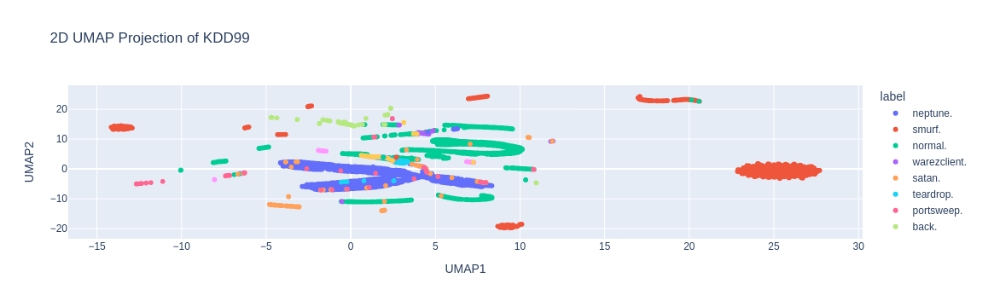

CPU times: user 19min 57s, sys: 4.91 s, total: 20min 2s
Wall time: 2min


In [9]:
%%time
# UMAP projection to 2D
umap_2d = umap.UMAP(n_neighbors=50, n_components=2) ## Valor por defecto de n_neighbors = 15
X_2d = umap_2d.fit_transform(X_sample)

# Create DataFrames for 2D and 3D projections
df_2d = pd.DataFrame(X_2d, columns=['UMAP1', 'UMAP2'])
df_2d['label'] = y_sample.values

# Plot 2D projection with Plotly
fig_2d = px.scatter(df_2d, x='UMAP1', y='UMAP2', color='label', title="2D UMAP Projection of KDD99")
fig_2d.show()

In [ ]:
# OPCIONAL: Podéis probar a ver la proyección de los datos en un espacio 3D, guardará ciertas similitudes con la 2D
%%time 

# Proyección UMAP en 3D
umap_3d = umap.UMAP(n_components=3, n_neighbors=50)
X_3d = umap_3d.fit_transform(X_sample)

df_3d = pd.DataFrame(X_3d, columns=['UMAP1', 'UMAP2', 'UMAP3'])
df_3d['label'] = y_sample.values

# Plot 3D projection with Plotly
fig_3d = px.scatter_3d(df_3d, x='UMAP1', y='UMAP2', z='UMAP3', color='label', title="3D UMAP Projection of KDD99")
fig_3d.show()

## Clustering con HDBSCAN

El **clustering** es una técnica esencial en el análisis de datos y el aprendizaje no supervisado. Su principal objetivo es agrupar un conjunto de objetos (datos) en clústeres, de manera que los elementos dentro de un mismo clúster sean más similares entre sí que a los de otros clústeres. Esto permite descubrir patrones y estructuras en datos no etiquetados, facilitando la identificación de segmentos o grupos relevantes.

El clustering se utiliza en diversas aplicaciones, como segmentación de clientes, detección de anomalías, compresión de imágenes y análisis de redes. La capacidad de agrupar datos de forma efectiva es crucial para la exploración y el análisis de grandes volúmenes de información.

### HDBSCAN: Un Algoritmo de Clustering Robusto

HDBSCAN es un algoritmo de clustering que extiende el algoritmo DBSCAN convirtiéndolo en un algoritmo de clustering jerárquico, utilizando una técnica para extraer un clustering plano basado en la estabilidad de los clústeres. A continuación, se presenta una descripción del funcionamiento del algoritmo y sus motivaciones.

### ¿Cómo Funciona HDBSCAN?

El algoritmo HDBSCAN se puede dividir en varios pasos:

1. **Transformar el Espacio**: HDBSCAN comienza por estimar la densidad de los puntos en el espacio de datos, diferenciando entre áreas densas (islas) y áreas menos densas (mar). Para hacer esto, se utiliza una métrica de distancia llamada **mutual reachability distance**, que ajusta las distancias de los puntos según su densidad.

2. **Construir el Árbol de Espanning Mínimo**: Con la nueva métrica de distancia, HDBSCAN construye un árbol de espanning mínimo, que representa las conexiones más fuertes entre los puntos, facilitando la identificación de clústeres densos.

3. **Construir la Jerarquía de Clústeres**: A partir del árbol de espanning, se genera una jerarquía de clústeres mediante un proceso de unión, donde los componentes conectados se combinan en clústeres a diferentes umbrales de distancia.

4. **Condensar el Árbol de Clústeres**: HDBSCAN condensa la jerarquía de clústeres al eliminar clústeres que no alcanzan un tamaño mínimo, lo que ayuda a filtrar el ruido y enfocarse en clústeres persistentes.

5. **Extraer Clústeres Estables**: Finalmente, el algoritmo identifica los clústeres más estables y robustos a partir de la jerarquía condensada, considerando la persistencia de los clústeres a lo largo de diferentes niveles de densidad.

### Conclusión

HDBSCAN ofrece una forma eficaz y robusta de realizar clustering en datos complejos y ruidosos. Su enfoque jerárquico y la capacidad de manejar clústeres de densidades variables lo convierten en una herramienta valiosa en el arsenal del análisis de datos. Este algoritmo no solo proporciona agrupamientos, sino que también permite identificar puntos de ruido, lo que mejora la interpretación y utilidad de los resultados en aplicaciones del mundo real.

El desarrollo continuo de la biblioteca HDBSCAN promete nuevas ideas, como algoritmos de clustering persistente y semi-supervisado, ampliando aún más su aplicabilidad en el análisis de datos.

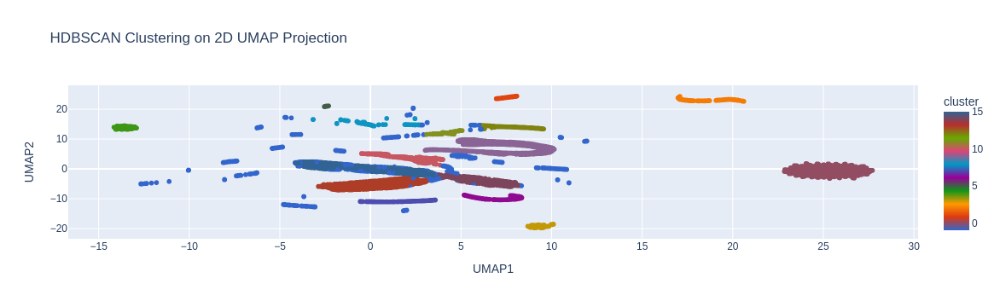

In [10]:
import hdbscan

# Perform HDBSCAN clustering on the 2D UMAP projection
clusterer = hdbscan.HDBSCAN(min_cluster_size=250, min_samples=150)
df_2d['cluster'] = clusterer.fit_predict(df_2d[['UMAP1', 'UMAP2']])

# Visualize the clusters using Plotly
fig_clusters = px.scatter(
df_2d, 
x='UMAP1', 
y='UMAP2', 
color='cluster',  # Color by the cluster assignments from HDBSCAN
title="HDBSCAN Clustering on 2D UMAP Projection",
color_continuous_scale=px.colors.qualitative.G10
)
fig_clusters.show()

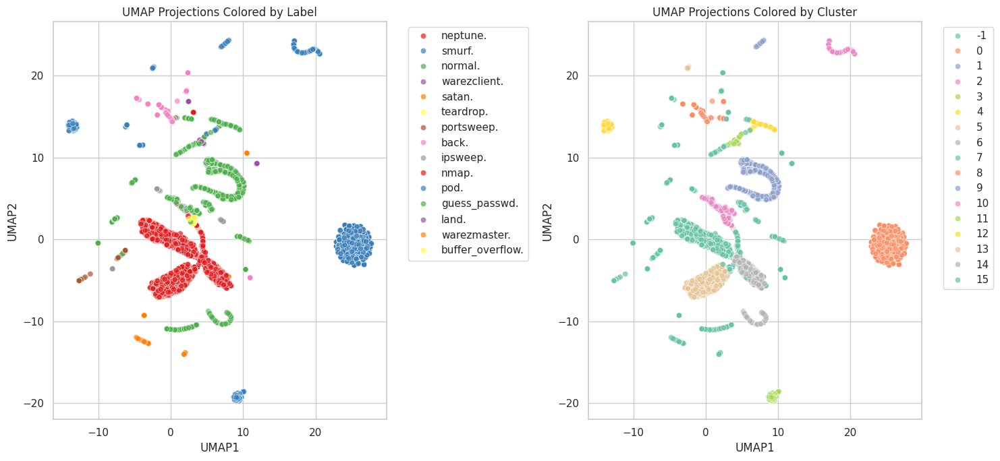

In [12]:
# Set the style
sns.set(style="whitegrid")

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 7))

# Representar las etiquetas
sns.scatterplot(ax=axes[0], x='UMAP1', y='UMAP2', hue='label', data=df_2d, palette='Set1', alpha=0.7)
axes[0].set_title('UMAP Projections Colored by Label')
axes[0].set_xlabel('UMAP1')
axes[0].set_ylabel('UMAP2')
axes[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Representar los clusters
sns.scatterplot(ax=axes[1], x='UMAP1', y='UMAP2', hue='cluster', data=df_2d, palette='Set2', alpha=0.7)
axes[1].set_title('UMAP Projections Colored by Cluster')
axes[1].set_xlabel('UMAP1')
axes[1].set_ylabel('UMAP2')
axes[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout to prevent overlap
plt.tight_layout()

# Save the figure to a file
plt.show()  # Close the figure to free memory